Versions of used libraries:\
numpy 1.21.6 \
pandas 1.3.5 \
keras 2.8.0 \
tensorflow 2.8.2

In [1]:
#you can check your versions using this func
def ver(lib):
  print(lib,lib.__version__)

#ver(np)

Importing needed libraries

In [2]:
import numpy as np
from google.colab import files
from PIL import Image
from PIL import ImageFile
import pandas as pd
import os
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from keras.utils import np_utils
from keras.utils.np_utils import to_categorical
from keras.preprocessing import image
import tensorflow as tf
import keras
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPooling2D, BatchNormalization,Activation, RandomFlip, RandomRotation, GaussianNoise


Setting seed for any random numbers repeatability.

In [3]:
seed=128
rng = np.random.RandomState(seed)

1. Getting the data

In [4]:
 #!pip install -q kaggle

In [6]:
!mkdir -p ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json

In [7]:
! kaggle competitions download -c 'diabetic-retinopathy-detection' -f train.zip.001

100% 7.81G/7.81G [00:52<00:00, 148MB/s]
100% 7.81G/7.81G [00:52<00:00, 160MB/s]


In [8]:
! kaggle competitions download -c 'diabetic-retinopathy-detection' -f trainLabels.csv.zip

  0% 0.00/69.4k [00:00<?, ?B/s]
100% 69.4k/69.4k [00:00<00:00, 54.9MB/s]


In [9]:
!unzip '/content/train.zip.001.zip'

Archive:  /content/train.zip.001.zip
  inflating: train.zip.001           


In [10]:
!unzip '/content/trainLabels.csv.zip'

Archive:  /content/trainLabels.csv.zip
  inflating: trainLabels.csv         


In [11]:
!7z x '/content/train.zip.001' -o.'/content/drive/MyDrive/train001'


7-Zip [64] 16.02 : Copyright (c) 1999-2016 Igor Pavlov : 2016-05-21
p7zip Version 16.02 (locale=en_US.UTF-8,Utf16=on,HugeFiles=on,64 bits,2 CPUs Intel(R) Xeon(R) CPU @ 2.30GHz (306F0),ASM,AES-NI)

Scanning the drive for archives:
  0M Scan /content/                   1 file, 8388608000 bytes (8000 MiB)

Extracting archive: /content/train.zip.001
  0% 1 Open             6% 512 Open              12% 1024 Open               18% 1536 Open               24% 2048 Open               30% 2560 Open               36% 3072 Open               42% 3584 Open               49% 4096 Open               52% 4352 Open               58% 4864 Open               64% 5376 Ope

2. Checking the data

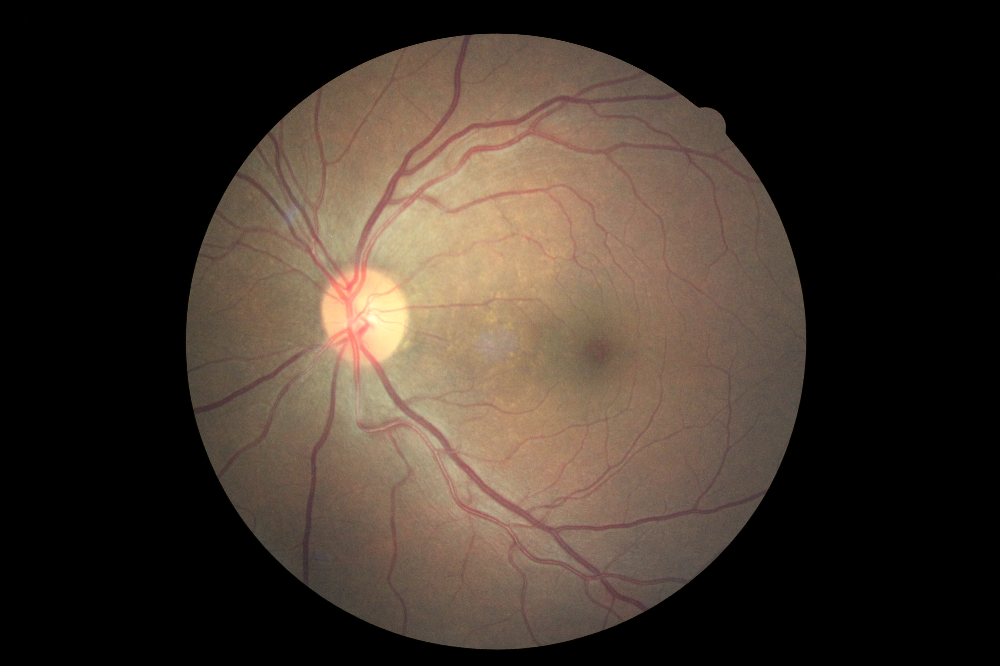

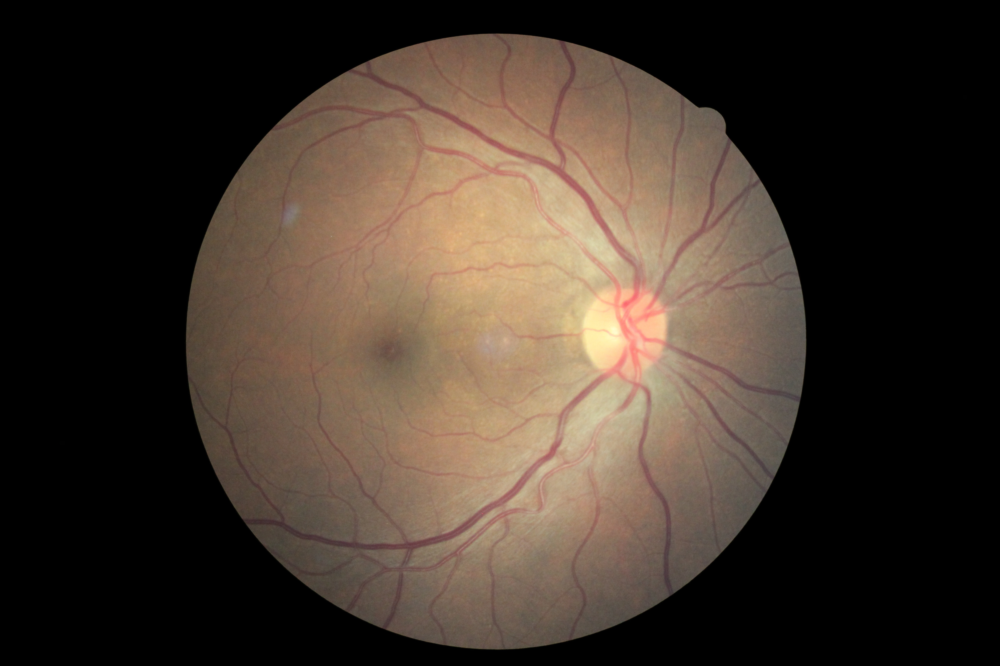

In [12]:
#data localization /content/content/drive/MyDrive/test001/test
from IPython.display import Image, display
display(Image('/content/content/drive/MyDrive/train001/train/10003_left.jpeg'))
display(Image('/content/content/drive/MyDrive/train001/train/10003_right.jpeg'))

In [13]:
labels=pd.read_csv('/content/trainLabels.csv')

In [14]:
labels.head()

,image,level
0,10_left,0
1,10_right,0
2,13_left,0
3,13_right,0
4,15_left,1


Class description:
0 - No DR
1 - Mild
2 - Moderate
3 - Severe
4 - Proliferative DR

In [15]:
print('The shape of label dataset:',labels.shape)
print('Unique values:',labels['level'].unique())
print('Is there any Null values:', labels.isnull().any())


The shape of label dataset: (35126, 2)
Unique values: [0 1 2 4 3]
Is there any Null values: image    False
level    False
dtype: bool


In [16]:
#checking if the number of right and left eyes is the same
lefts = len([col for col in labels.image if 'left' in col])
rights= len([col for col in labels.image if 'right' in col])
print(lefts)
print(rights)

17563
17563


In [17]:
list_of_files=os.listdir('/content/content/drive/MyDrive/train001/train')
list_of_files = [item.replace('.jpeg', '') for item in list_of_files]


In [18]:
#get labels only for certain files
labels = labels[labels['image'].isin(list_of_files)]

In [19]:
#checking if number of labels and images are correct
print('Labels length',len(labels))
print('Number of images',len(list_of_files))

Labels length 8408
Number of images 8408


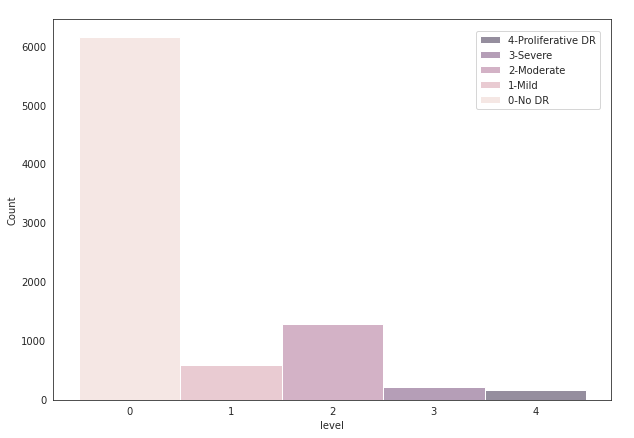

In [20]:
#checking data distrubution
sns.set_style("white")
fig=plt.figure(figsize=(10, 7))

sns.histplot(data=labels, x="level",hue='level', discrete=True, legend=False)
fig.legend(labels=['4-Proliferative DR','3-Severe','2-Moderate','1-Mild','0-No DR'],fontsize=10,loc=(0.75,0.75))


In [21]:
names=[]
values=[]
for number in labels['level'].unique():
  name="class_" + str(number)
  names.append(name)
  val =labels['level'][labels["level"]==number].count()/labels['level'].count()
  val=round(val*100,2)
  values.append(val)
  print(name, val,'%')


class_0 73.14 %
class_1 6.99 %
class_2 15.26 %
class_4 1.97 %
class_3 2.63 %


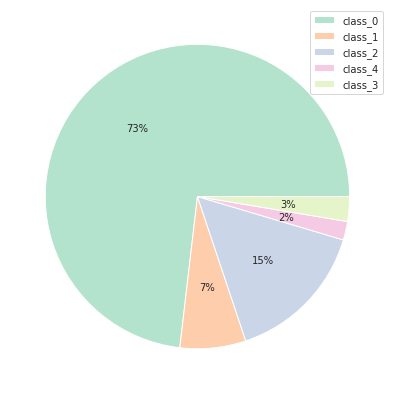

In [22]:
colors = sns.color_palette('Pastel2')[0:5]
fig=plt.figure(figsize=(7,7))
#create pie chart
plt.pie(values, colors = colors, autopct='%.0f%%')
plt.legend(names,loc=1)
plt.show()

Label: 0


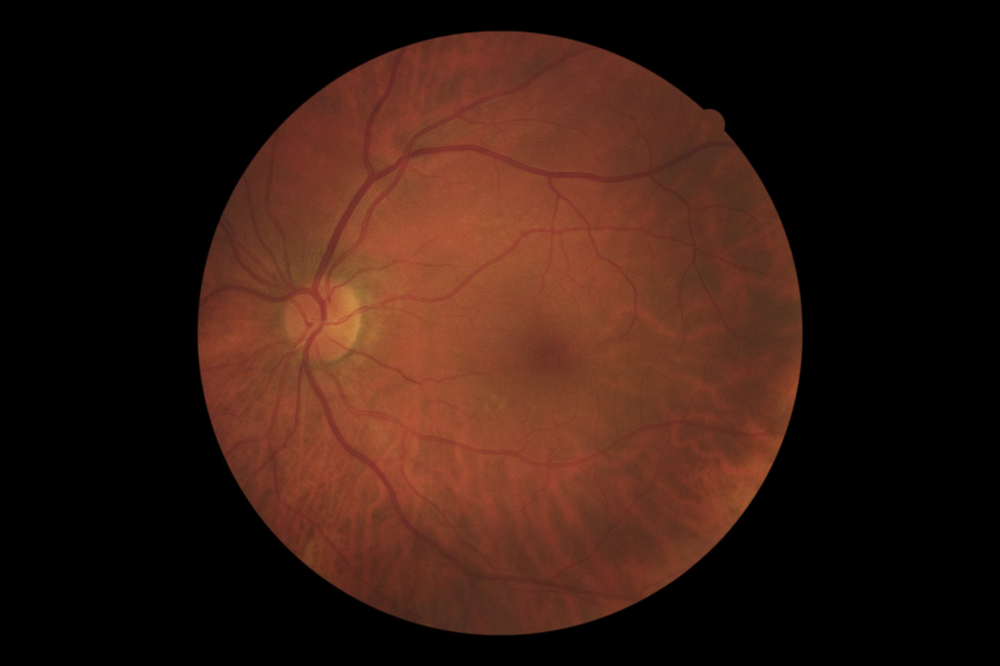

Label: 1


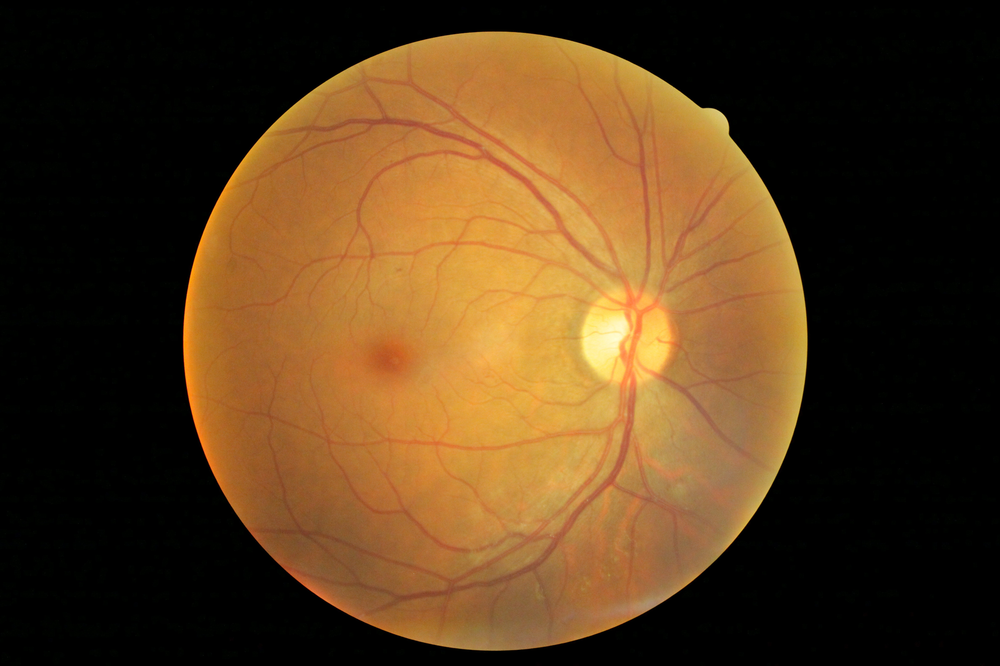

Label: 2


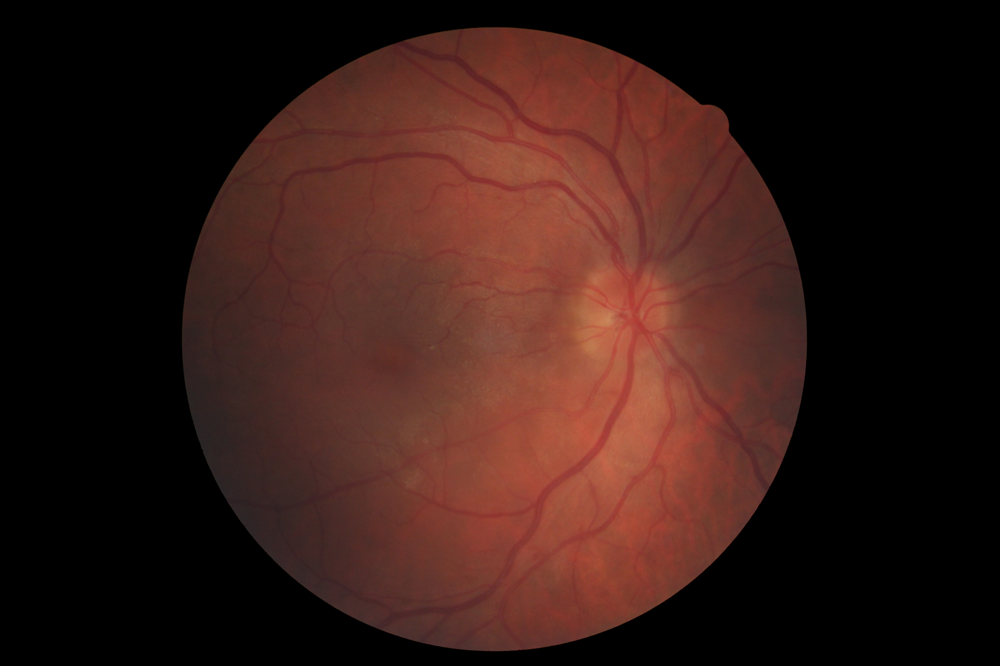

Label: 3


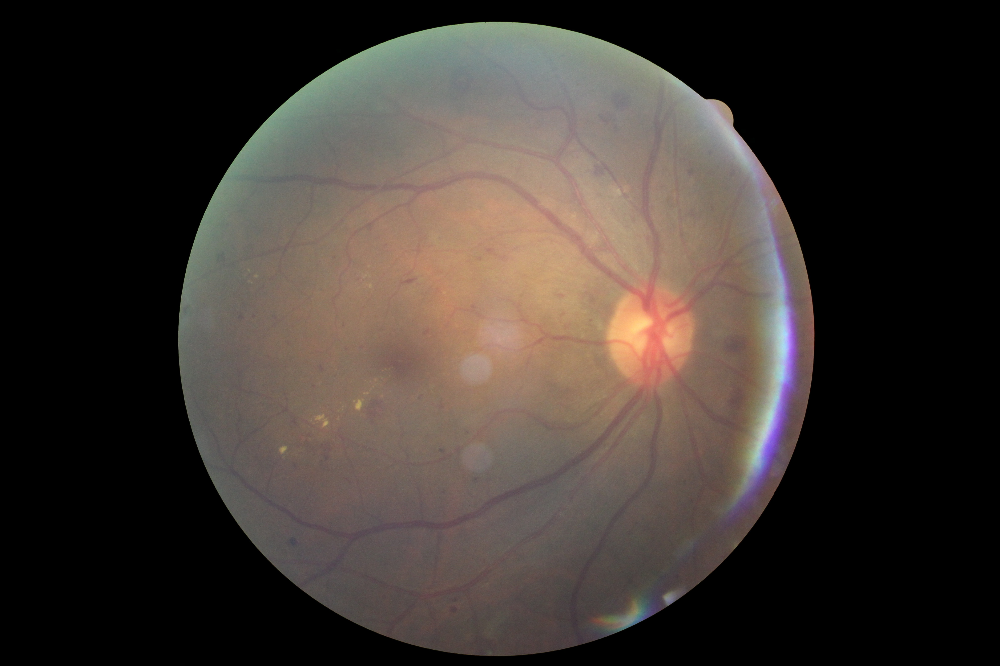

Label: 4


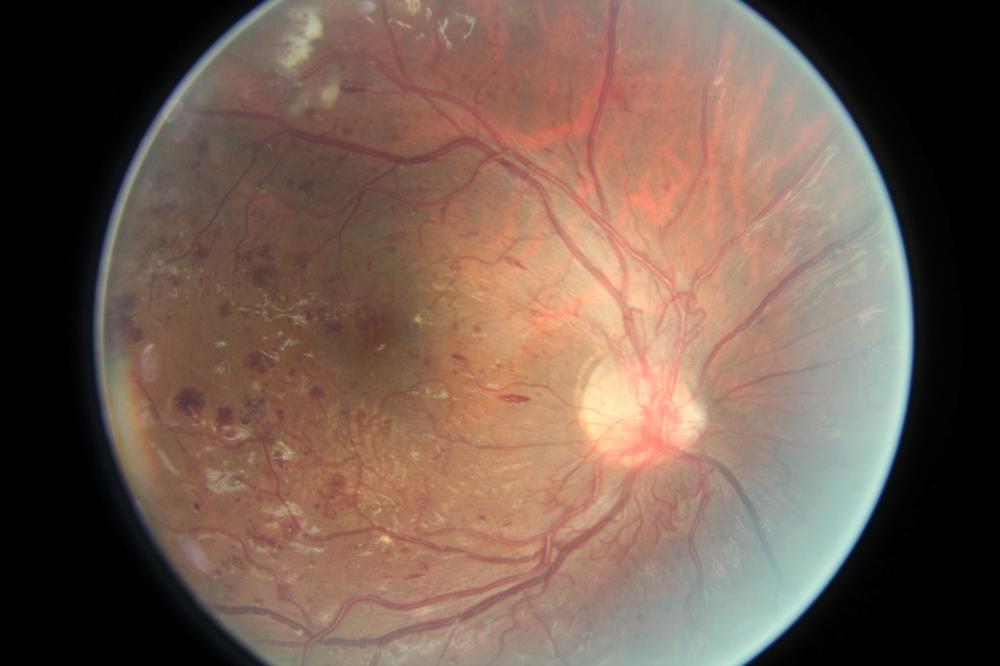

In [23]:
PATH = '/content/content/drive/MyDrive/train001/train/'
LABELS = [0,1,2,3,4]
IMAGES_PER_CLASS = 1

#Contains image_id field which is the filename of the image
train = labels

def show_images(row):
    display(Image(filename=PATH + row['image'] + '.jpeg',width=400,height=300))

for label in LABELS:
    print('Label:',label)
    images = train[train['level']==label].sample(frac=1).iloc[0:IMAGES_PER_CLASS,:]
    images.apply(show_images, axis=1)

Data preprocessig- adding new columns.

Because of the distribution in the dataset it was decided to divide images into two group 0-healthy and 1-sick. All groups beside 0 were collected into group 1. Eye group was made where 1-right eye, 0-left eye.

In [24]:
labels['PatientId'] = labels['image'].map(lambda x: x.split('_')[0])

labels['sick'] = 0
labels.loc[labels['level'] >= 1,'sick'] = 1

labels['eye'] = 0
labels.loc[labels['image'].str.contains('right'),'eye'] = 1
#/content/content/drive/MyDrive/train001/train/10003_left.jpeg
base_image_dir = os.path.join('/content/content/drive/MyDrive/train001/train/')
labels['path'] = labels['image'].map(lambda x: os.path.join(base_image_dir,
                                                         '{}.jpeg'.format(x)))
labels['level_cat'] = labels['sick'].map(lambda x: to_categorical(x, 1+labels['sick'].max()))
labels.head()

,image,level,PatientId,sick,eye,path,level_cat
0,10_left,0,10,0,0,/content/content/drive/MyDrive/train001/train/...,"[1.0, 0.0]"
1,10_right,0,10,0,1,/content/content/drive/MyDrive/train001/train/...,"[1.0, 0.0]"
2,13_left,0,13,0,0,/content/content/drive/MyDrive/train001/train/...,"[1.0, 0.0]"
3,13_right,0,13,0,1,/content/content/drive/MyDrive/train001/train/...,"[1.0, 0.0]"
4,15_left,1,15,1,0,/content/content/drive/MyDrive/train001/train/...,"[0.0, 1.0]"


Checking the distribution.

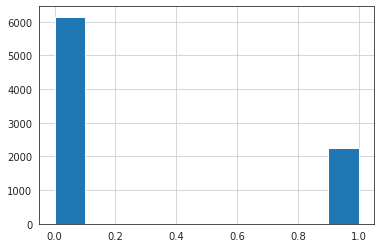

In [25]:
labels['sick'].hist()

Here we can see that images with healthy eyes are in bigger number than affected eyes images. 

Splitting the dataset into training and testin subset.

Balancing the distribution in the training dataset.

New Data Size: 2000 Old Size: 2000


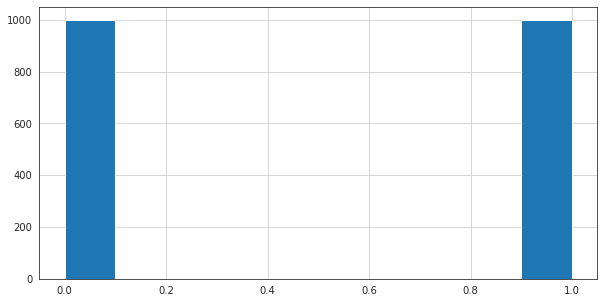

In [26]:
labels= labels.groupby(['sick']).apply(lambda x: x.sample(1000, replace = True)
                                                      ).reset_index(drop = True)
print('New Data Size:', labels.shape[0], 'Old Size:', labels.shape[0])
labels['sick'].hist(figsize = (10, 5))

In [27]:
print(labels.shape)


(2000, 7)


In [28]:
labels.head()


,image,level,PatientId,sick,eye,path,level_cat
0,18253_right,0,18253,0,1,/content/content/drive/MyDrive/train001/train/...,"[1.0, 0.0]"
1,17852_right,0,17852,0,1,/content/content/drive/MyDrive/train001/train/...,"[1.0, 0.0]"
2,15946_left,0,15946,0,0,/content/content/drive/MyDrive/train001/train/...,"[1.0, 0.0]"
3,10206_left,0,10206,0,0,/content/content/drive/MyDrive/train001/train/...,"[1.0, 0.0]"
4,1377_left,0,1377,0,0,/content/content/drive/MyDrive/train001/train/...,"[1.0, 0.0]"


In [29]:
from PIL import Image
from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True
# resize the image to (256, 256)
img_rows, img_cols = 256, 256

immatrix = []
imlabel = []


for image in labels['path']:
  im = Image.open(image)
  img = np.array(im.resize((img_rows,img_cols)))
  imlabel.append(labels.loc[labels['path']==image, 'sick'].values[0])
  immatrix.append(img)

In [30]:
data,label = shuffle(immatrix, imlabel, random_state=42)
train_data = [data,label]

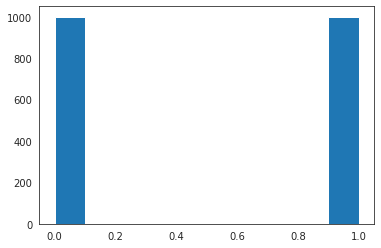

In [31]:
import matplotlib.pyplot as plt
plt.hist(imlabel)
plt.show()



In [32]:
print(np.array(train_data).shape)

(2, 2000)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  """Entry point for launching an IPython kernel.


In [33]:
x_train, x_test, y_train, y_test = train_test_split(train_data[0], train_data[1], test_size = 0.1, random_state = 42)

print(np.array(x_train).shape)
print(np.array(y_train).shape)

(1800, 256, 256, 3)
(1800,)


In [34]:
y_train = np_utils.to_categorical(np.array(y_train), 2)
y_test = np_utils.to_categorical(np.array(y_test), 2)

x_train = np.array(x_train).astype("float32")/255.
x_test = np.array(x_test).astype("float32")/255.

print(np.array(y_train).shape)

(1800, 2)


Training without data augumentation.

In [35]:
model = Sequential()

model.add(Conv2D(32, (3, 3), padding='same', activation='relu', input_shape=x_train[0].shape))
model.add(Conv2D(32, (3, 3), activation='relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D())
model.add(Dropout(0.25))

model.add(Conv2D(64, (3, 3), padding='same', activation='relu'))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D())
model.add(Dropout(0.25))

model.add(Conv2D(64, (3, 3), padding='same', activation='relu'))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D())
model.add(Dropout(0.25))
model.add(Flatten())
model.add(Dense(256, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(activation='softmax', units=2))

model.compile(loss='categorical_crossentropy', optimizer = 'adam', metrics=["accuracy"])

In [36]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 256, 256, 32)      896       
                                                                 
 conv2d_1 (Conv2D)           (None, 254, 254, 32)      9248      
                                                                 
 batch_normalization (BatchN  (None, 254, 254, 32)     128       
 ormalization)                                                   
                                                                 
 max_pooling2d (MaxPooling2D  (None, 127, 127, 32)     0         
 )                                                               
                                                                 
 dropout (Dropout)           (None, 127, 127, 32)      0         
                                                                 
 conv2d_2 (Conv2D)           (None, 127, 127, 64)      1

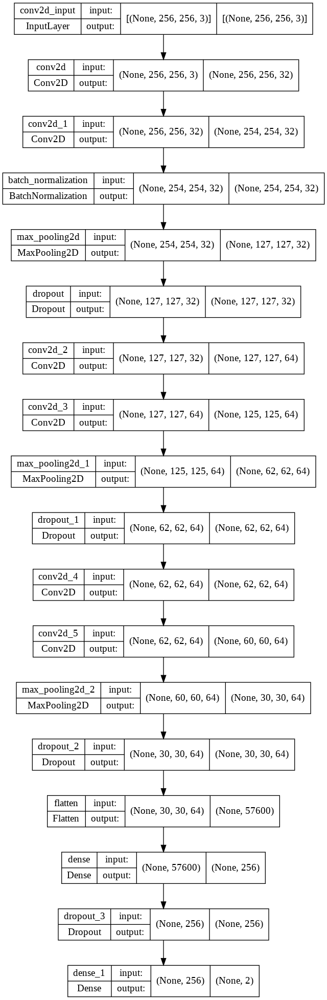

In [37]:
tf.keras.utils.plot_model(model, to_file="model1.png", show_shapes=True)

In [38]:
model_trained=model.fit(x_train, y_train, batch_size = 16, epochs=5)

Epoch 1/5
113/113 [==============================] - 25s 91ms/step - loss: 0.9470 - accuracy: 0.4856
Epoch 2/5
113/113 [==============================] - 9s 83ms/step - loss: 0.6933 - accuracy: 0.4711
Epoch 3/5
113/113 [==============================] - 10s 85ms/step - loss: 0.6934 - accuracy: 0.4872
Epoch 4/5
113/113 [==============================] - 9s 84ms/step - loss: 0.6932 - accuracy: 0.5000
Epoch 5/5
113/113 [==============================] - 10s 85ms/step - loss: 0.6933 - accuracy: 0.4861


In [39]:
y_pred=model.predict(x_test)
kbacc = tf.keras.metrics.BinaryAccuracy()
_ = kbacc.update_state(y_test, y_pred)
print(f'Keras BinaryAccuracy acc: {kbacc.result().numpy()*100:.3}')

Keras BinaryAccuracy acc: 51.0


In [40]:
def plotTrainingHistory(model):
  model_history = model
  plt.plot(model_history.history['accuracy'])
  plt.plot(model_history.history['val_accuracy'])
  plt.ylabel('accuracy')
  plt.xlabel('epochs')
  plt.legend(['train', 'test'], loc='upper left')
  plt.show()

  plt.plot(model_history.history['loss'])
  plt.plot(model_history.history['val_loss'])
  plt.ylabel('Loss function')
  plt.xlabel('epochs')
  plt.legend(['tain', 'test'], loc='upper left')
  plt.show()

In [41]:
model = Sequential()
model.add(tf.keras.applications.resnet50.ResNet50(input_shape=(256,256,3),include_top=False,weights='imagenet'))
for layer in model.layers:
    layer.trainable = False
model.add(Flatten())
model.add(Dense(16,kernel_initializer='he_uniform'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Dropout(0.5))
model.add(Dense(units= 2, activation='softmax'))

c3=tf.keras.callbacks.ReduceLROnPlateau(
    monitor="val_loss",
    factor=0.1,
    patience=2,
    mode="auto",
    min_delta=0.0001,
    cooldown=0,
    min_lr=0.001
)
model.compile(optimizer='adam',loss='categorical_crossentropy', metrics=['accuracy','AUC'])
history=model.fit(x_train,y_train,epochs=50,batch_size=16,validation_split=0.2)

94781440/94765736 [==============================] - 2s 0us/step
Epoch 1/50
90/90 [==============================] - 15s 107ms/step - loss: 0.9933 - accuracy: 0.5000 - auc: 0.5084 - val_loss: 1.4355 - val_accuracy: 0.4972 - val_auc: 0.5298
Epoch 2/50
90/90 [==============================] - 7s 83ms/step - loss: 0.8431 - accuracy: 0.4889 - auc: 0.4985 - val_loss: 0.8482 - val_accuracy: 0.5278 - val_auc: 0.5341
Epoch 3/50
90/90 [==============================] - 7s 83ms/step - loss: 0.7603 - accuracy: 0.5396 - auc: 0.5432 - val_loss: 0.7269 - val_accuracy: 0.5056 - val_auc: 0.5122
Epoch 4/50
90/90 [==============================] - 8s 84ms/step - loss: 0.7606 - accuracy: 0.5069 - auc: 0.5182 - val_loss: 0.7427 - val_accuracy: 0.5194 - val_auc: 0.5524
Epoch 5/50
90/90 [==============================] - 8s 84ms/step - loss: 0.7260 - accuracy: 0.5285 - auc: 0.5344 - val_loss: 0.6935 - val_accuracy: 0.5472 - val_auc: 0.5808
Epoch 6/50
90/90 [==============================] - 8s 84ms/step - l

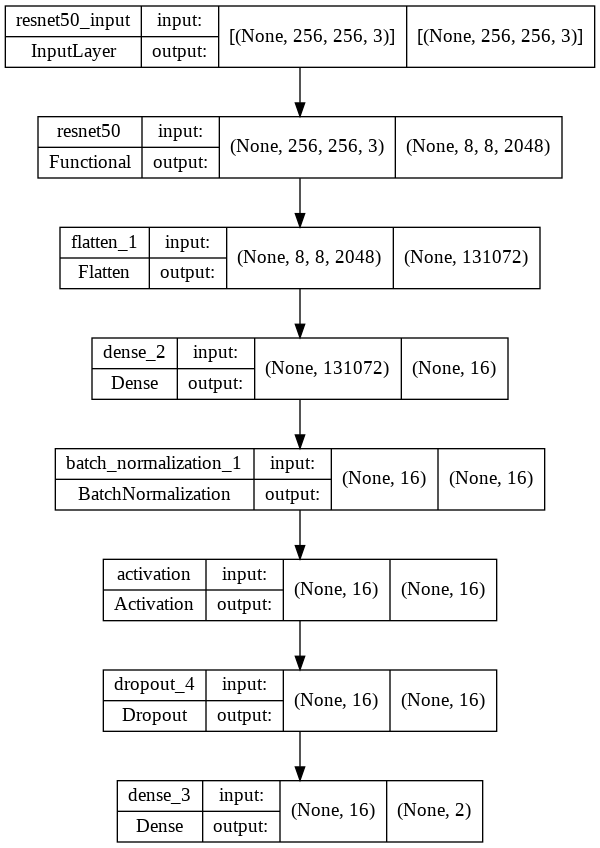

In [42]:
tf.keras.utils.plot_model(model, to_file="model2.png", show_shapes=True)

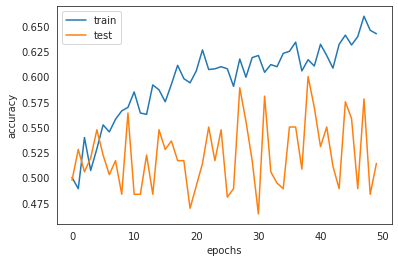

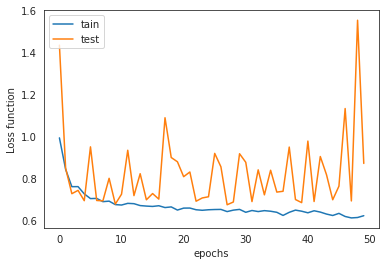

In [43]:
plotTrainingHistory(history)   

In [44]:
y_pred=model.predict(x_test)
kbacc = tf.keras.metrics.BinaryAccuracy()
_ = kbacc.update_state(y_test, y_pred)
print(f'Keras BinaryAccuracy acc: {kbacc.result().numpy()*100:.3}')

Keras BinaryAccuracy acc: 50.5


In [45]:
model = Sequential()
model.add(RandomFlip("horizontal_and_vertical"))
model.add(RandomRotation(0.2))
model.add(GaussianNoise(stddev=0.2))

model.add(Conv2D(32, (3, 3), padding='same', activation='relu', input_shape=x_train[0].shape))
model.add(Conv2D(32, (3, 3), activation='relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D())
model.add(Dropout(0.25))

model.add(Conv2D(64, (3, 3), padding='same', activation='relu'))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D())
model.add(Dropout(0.25))

model.add(Conv2D(64, (3, 3), padding='same', activation='relu'))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D())
model.add(Dropout(0.25))
model.add(Flatten())
model.add(Dense(256, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(activation='softmax', units=2))

model.compile(loss='categorical_crossentropy', optimizer = 'adam', metrics=["accuracy"])

In [46]:
model_trained_aug=model.fit(x_train, y_train, batch_size = 16, epochs=10)

Epoch 1/10
113/113 [==============================] - 12s 90ms/step - loss: 1.2642 - accuracy: 0.4889
Epoch 2/10
113/113 [==============================] - 10s 90ms/step - loss: 0.6933 - accuracy: 0.4917
Epoch 3/10
113/113 [==============================] - 10s 90ms/step - loss: 0.6933 - accuracy: 0.5000
Epoch 4/10
113/113 [==============================] - 10s 90ms/step - loss: 0.6933 - accuracy: 0.5006
Epoch 5/10
113/113 [==============================] - 10s 91ms/step - loss: 0.6936 - accuracy: 0.4811
Epoch 6/10
113/113 [==============================] - 10s 91ms/step - loss: 0.6933 - accuracy: 0.4889
Epoch 7/10
113/113 [==============================] - 10s 91ms/step - loss: 0.6933 - accuracy: 0.4789
Epoch 8/10
113/113 [==============================] - 10s 91ms/step - loss: 0.6934 - accuracy: 0.4856
Epoch 9/10
113/113 [==============================] - 10s 91ms/step - loss: 0.6932 - accuracy: 0.4983
Epoch 10/10
113/113 [==============================] - 10s 91ms/step - loss: 0.694

In [47]:
y_pred=model.predict(x_test)
kbacc = tf.keras.metrics.BinaryAccuracy()
_ = kbacc.update_state(y_test, y_pred)
print(f'Keras BinaryAccuracy acc: {kbacc.result().numpy()*100:.3}')

Keras BinaryAccuracy acc: 51.0


In [48]:
model = Sequential()
model.add(RandomFlip("horizontal_and_vertical"))
model.add(RandomRotation(0.2))
model.add(GaussianNoise(stddev=0.2))
model.add(tf.keras.applications.resnet50.ResNet50(input_shape=(256,256,3),include_top=False,weights='imagenet'))
for layer in model.layers:
    layer.trainable = False
model.add(Flatten())
model.add(Dense(16,kernel_initializer='he_uniform'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Dropout(0.5))
model.add(Dense(units= 2, activation='softmax'))

c3=tf.keras.callbacks.ReduceLROnPlateau(
    monitor="val_loss",
    factor=0.1,
    patience=2,
    mode="auto",
    min_delta=0.0001,
    cooldown=0,
    min_lr=0.001
)
model.compile(optimizer='adam',loss='categorical_crossentropy', metrics=['accuracy','AUC'])
history=model.fit(x_train,y_train,epochs=50,batch_size=16,validation_split=0.2)

Epoch 1/50
90/90 [==============================] - 14s 108ms/step - loss: 0.9720 - accuracy: 0.5097 - auc: 0.5148 - val_loss: 6.5414 - val_accuracy: 0.4861 - val_auc: 0.4861
Epoch 2/50
90/90 [==============================] - 8s 89ms/step - loss: 0.8628 - accuracy: 0.5049 - auc: 0.5027 - val_loss: 1.4958 - val_accuracy: 0.4833 - val_auc: 0.4760
Epoch 3/50
90/90 [==============================] - 8s 89ms/step - loss: 0.8064 - accuracy: 0.5090 - auc: 0.5091 - val_loss: 1.2327 - val_accuracy: 0.4722 - val_auc: 0.4811
Epoch 4/50
90/90 [==============================] - 8s 88ms/step - loss: 0.7705 - accuracy: 0.5167 - auc: 0.5127 - val_loss: 1.4535 - val_accuracy: 0.4806 - val_auc: 0.4631
Epoch 5/50
90/90 [==============================] - 8s 89ms/step - loss: 0.7266 - accuracy: 0.5347 - auc: 0.5406 - val_loss: 0.9991 - val_accuracy: 0.4750 - val_auc: 0.4805
Epoch 6/50
90/90 [==============================] - 8s 89ms/step - loss: 0.7298 - accuracy: 0.5028 - auc: 0.5088 - val_loss: 0.8347 -

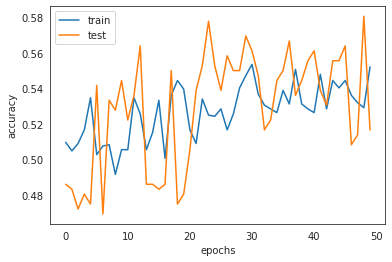

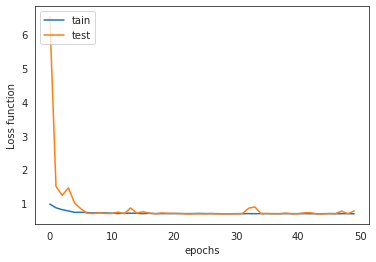

In [49]:
plotTrainingHistory(history)

In [50]:
y_pred=model.predict(x_test)
kbacc = tf.keras.metrics.BinaryAccuracy()
_ = kbacc.update_state(y_test, y_pred)
print(f'Keras BinaryAccuracy acc: {kbacc.result().numpy()*100:.3}')

Keras BinaryAccuracy acc: 51.5
